# Image Alignment
Before creating pairs of images upon which to train, we must first align them. This is because the deliveries typically have geometric corrections applied, whereas the pristines don't. We explore standard approaches.

## Homography
We explore computing an outlier-robust homography between detected keypoints in the image pair.

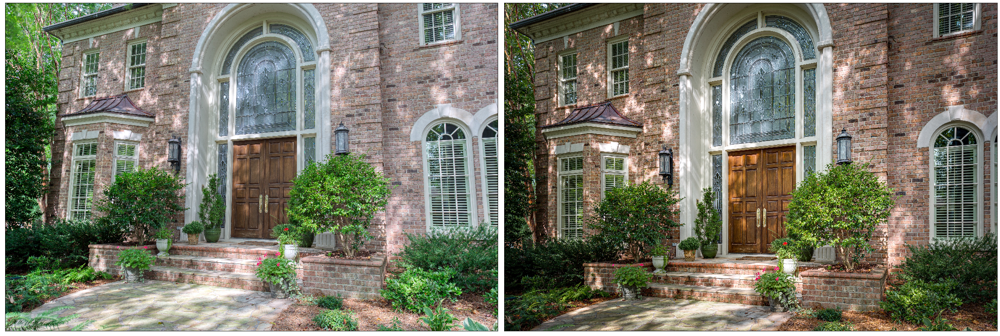

In [72]:
from imageio import imread
from matplotlib import pyplot as plt

# Load
image_a = imread("../media/prelims/aurora.jpg")
image_b = imread("../media/prelims/delivery.jpg")

# Show
plt.figure(figsize=(30, 20))
plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_a)
plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b)
plt.tight_layout()
plt.show()

Now, we detect features:

In [ ]:
from cv2 import DescriptorMatcher_create, drawMatches, ORB_create, DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
from imageio import imwrite

# Detect features
orb = ORB_create(1000)
keypoints_a, descriptors_a = orb.detectAndCompute(image_a, None)
keypoints_b, descriptors_b = orb.detectAndCompute(image_b, None)

# Match features
matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches = matcher.match(descriptors_a, descriptors_b, None)
matches = sorted(matches, key=lambda x: x.distance)
top_k = int(len(matches) * 0.15)
matches = matches[:top_k]

# Draw matches
image_matches = drawMatches(image_a, keypoints_a, image_b, keypoints_b, matches, None)
plt.figure(figsize=(30, 20))
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches, interpolation="bilinear")
plt.show()

# Write
imwrite("matches.jpg", image_matches)

Now, we apply a homography matching the pristine image to the delivery.

In [ ]:
from cv2 import findHomography, warpPerspective, RANSAC
from numpy import float32, zeros

# Extract location of good matches
points_a = zeros((len(matches), 2), dtype=float32)
points_b = zeros((len(matches), 2), dtype=float32)
for i, match in enumerate(matches):
    points_a[i, :] = keypoints_a[match.queryIdx].pt
    points_b[i, :] = keypoints_b[match.trainIdx].pt

# Warp image
H, mask = findHomography(points_a, points_b, RANSAC)
height, width, _ = image_b.shape
result_a = warpPerspective(image_a, H, (width, height))

# Display
plt.figure(figsize=(30, 20))
plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(result_a)
plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b)
plt.tight_layout()
plt.show()

# Write
imwrite("warped.jpg", result_a)

## Scaled Homography
The homography approach works very well. The only limitation is speed. We need to accelerate it significantly. To do so, we downsample the image.

In [83]:
from cv2 import DescriptorMatcher_create, drawMatches, ORB_create, DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
from numpy import array, ndarray

def align_image (source: ndarray, target: ndarray) -> ndarray:
    """
    Align a source image with a target image.

    Parameters:
        source (ndarray): Source image with shape (Hs,Ws,C).
        target (ndarray): Target image with shape (Ht,Wt,C).

    Returns:
        ndarray: Aligned source image with shape (Ht,Wt,C).
    """
    # Downsample
    height, width, _ = target.shape
    orb = ORB_create(1500)
    keypoints_a, descriptors_a = orb.detectAndCompute(source, None)
    keypoints_b, descriptors_b = orb.detectAndCompute(target, None)
    # Match features
    matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors_a, descriptors_b, None)
    matches = sorted(matches, key=lambda x: x.distance)
    top_k = int(len(matches) * 0.20)
    matches = matches[:top_k]
    # Extract correspondence points
    points_a = array([keypoints_a[match.queryIdx].pt for match in matches])
    points_b = array([keypoints_b[match.trainIdx].pt for match in matches])
    # Warp image
    H, mask = findHomography(points_a, points_b, RANSAC)
    result = warpPerspective(source, H, (width, height))
    return result

In [84]:
    result = align_image(image_a, image_b)
    imwrite("result.jpg", result)